In [1]:
%cd ..

/mnt/c/Users/marya/PycharmProjects/Music-recognition


In [2]:
import torch
import torchaudio
import IPython.display as ipd

def augment(waveform, sample_rate):
    # Apply filtering and change sample rate
    waveform, sample_rate = torchaudio.sox_effects.apply_effects_tensor(
        waveform,
        sample_rate,
        effects=[
            ["lowpass", "4000"],
            ["compand", "0.02,0.05", "-60,-60,-30,-10,-20,-8,-5,-8,-2,-8", "-8", "-7", "0.05"],
            ["rate", "8000"],
        ],
    )

    # Apply telephony codec
    waveform = torchaudio.functional.apply_codec(waveform, sample_rate, format="gsm")

    return waveform, sample_rate

ModuleNotFoundError: No module named 'torch'

In [3]:
waveform, sample_rate = torchaudio.load('data/songs/000/000002.mp3')
ipd.Audio(waveform, rate=sample_rate)

NameError: name 'torchaudio' is not defined

In [4]:
augmented_samples, sample_rate = augment(waveform, sample_rate)
ipd.Audio(augmented_samples, rate=sample_rate)

In [38]:
import numpy as np
from audiomentations import Compose, AddGaussianSNR, AddBackgroundNoise, Gain, ClippingDistortion, LowPassFilter, HighPassFilter, BandPassFilter

waveform, sample_rate = torchaudio.load('data/songs/000/000002.mp3')

augmenter = Compose([
    LowPassFilter(min_cutoff_freq=150, max_cutoff_freq=7500, p=.25),
    HighPassFilter(min_cutoff_freq=150, max_cutoff_freq=7500, p=.25),
    BandPassFilter(min_center_freq=100.0, max_center_freq=1000.0, min_q=1.0, max_q=2.0, p=.25),
    AddBackgroundNoise(sounds_path='data/background_segments', min_snr_in_db=1, max_snr_in_db=10, p=.8),
    Gain(min_gain_in_db=-6, max_gain_in_db=6, p=.8),
    AddGaussianSNR(min_snr_in_db=10, max_snr_in_db=20, p=.5),
    ClippingDistortion(min_percentile_threshold=0, max_percentile_threshold=40, p=.25),
    LowPassFilter(min_cutoff_freq=150, max_cutoff_freq=7500, p=.25),
    HighPassFilter(min_cutoff_freq=150, max_cutoff_freq=7500, p=.25),
    BandPassFilter(min_center_freq=100.0, max_center_freq=1000.0, min_q=1.0, max_q=2.0, p=.25),
])
samples_out = augmenter(samples=waveform[0].numpy(), sample_rate=sample_rate)
ipd.Audio(samples_out, rate=sample_rate)

In [40]:
import time

times_log = []

while True:
    start = time.time()
    samples_out = augmenter(samples=waveform[0].numpy(), sample_rate=sample_rate)
    times_log.append(time.time() - start)
    print(times_log[-1])
    
#ipd.Audio(samples_out, rate=sample_rate)

2.545387029647827
0.6844527721405029
1.9002931118011475
1.4620387554168701
0.06437015533447266
3.1571929454803467
1.8935678005218506
0.07608795166015625
1.8632328510284424
1.1119873523712158
1.8518116474151611
1.436143159866333
2.957475423812866
0.0961003303527832
1.8397669792175293
1.7945399284362793
1.1432008743286133
1.254382610321045
0.6911537647247314
1.8549134731292725
0.09523940086364746
0.6918132305145264
1.8604371547698975
0.749136209487915
3.0251266956329346
1.2498581409454346
1.2343816757202148
3.152172088623047
2.4983184337615967
0.03054642677307129
0.06845498085021973
0.7366023063659668
1.1516118049621582
0.04745626449584961
0.689957857131958
4.691174268722534
2.3031890392303467
0.06778359413146973
1.885448932647705
3.0678882598876953
0.0762479305267334
5.887721300125122
0.07156753540039062
4.4439311027526855
0.8589334487915039
4.334201335906982
0.6870348453521729
1.8459396362304688
1.465620756149292
1.815457820892334
2.6065893173217773
1.831413984298706
4.397102355957031


KeyboardInterrupt: 

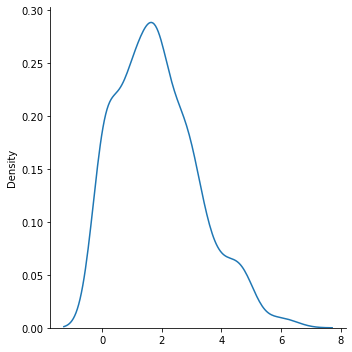

In [41]:
import seaborn as sns
sns.displot(times_log, kind="kde")

In [75]:
from musicrecognition.phone_torchaugmentation import augment
samples_out = augment(samples=waveform.mean(0).unsqueeze(0).unsqueeze(0), sample_rate=sample_rate)
ipd.Audio(samples_out[0], rate=sample_rate)

In [68]:
torch_log = []

while True:
    start = time.time()
    samples_out = augment(samples=waveform.unsqueeze(0), sample_rate=sample_rate)
    torch_log.append(time.time() - start)
    print(torch_log[-1])

0.13628911972045898
0.03125286102294922
0.06327080726623535
0.1182107925415039
0.07579255104064941
0.06592130661010742
0.0916132926940918
0.08461213111877441
0.1402294635772705
0.017295360565185547
0.0683143138885498
0.08146476745605469
0.025675535202026367
0.09624910354614258
0.06493687629699707
0.10702919960021973
0.09701395034790039
0.11453366279602051
0.08586812019348145
0.06419086456298828
0.06233024597167969
0.08151531219482422
0.0834808349609375
0.10282397270202637
0.029095888137817383
0.08827567100524902
0.07189416885375977
0.019371986389160156
0.06446146965026855
0.010103702545166016
0.028066396713256836
0.028290510177612305
0.06925177574157715
0.06452274322509766
0.029673099517822266
0.025115013122558594
0.10920190811157227
0.03196454048156738
0.020684480667114258
0.12598800659179688
0.01819777488708496
0.04624819755554199
0.10791277885437012
0.10448741912841797
0.030006885528564453
0.11095762252807617
0.03252744674682617
0.028972625732421875
0.017728090286254883
0.1160831451

KeyboardInterrupt: 

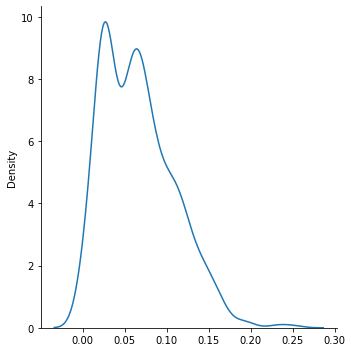

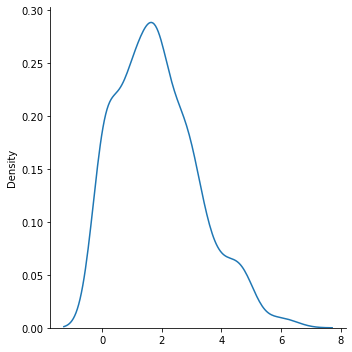

In [73]:
sns.displot(torch_log, kind='kde')
sns.displot(times_log, kind="kde")

In [17]:
from pathlib import Path
from musicrecognition.audio_dataloader import AudioDataloader
from musicrecognition.train import get_song_paths
from musicrecognition.augmentation import get_augmenter

data_root = Path('data')
songs_paths = get_song_paths(data_root / 'songs')
augmenter = get_augmenter(data_root / 'background_wav')
audio_loader = AudioDataloader(songs_paths, augmenter, 4, 10, 30, 44100)

In [34]:
anchors, positives, negatives = next(audio_loader)
ipd.display(ipd.Audio(anchors[0], rate=44100))
ipd.display(ipd.Audio(positives[0], rate=44100))
ipd.display(ipd.Audio(negatives[0], rate=44100))

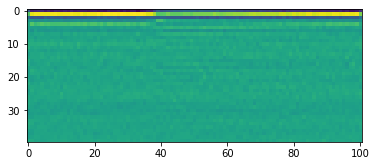

In [57]:
import matplotlib.pyplot as plt
mfcc = torchaudio.transforms.MFCC(44100)
pic = mfcc(anchors[0, 0, :20000])
plt.imshow(pic)
plt.show()
ipd.display(ipd.Audio(anchors[0], rate=44100))

In [63]:
anchors.transpose(0, 1).shape

torch.Size([1, 4, 981925])

In [73]:
for x in torch.split(mfcc(torch.stack([anchors[:, 0], positives[:, 0]])), 1):
    print(x.shape)

torch.Size([1, 4, 40, 4910])
torch.Size([1, 4, 40, 4910])


In [74]:
anchors.shape

torch.Size([4, 1, 981925])